In [0]:
"""About Feature

customerID: Customer ID
gender: Whether the customer is a male or a female
Senior Citizen: Whether the customer is a senior citizen or not (1, 0)
Partner: Whether the customer has a partner or not (Yes, No)
Dependents: Whether the customer has dependents or not (Yes, No)
tenure: Number of months the customer has stayed with the company
Phone Service: Whether the customer has a phone service or not (Yes, No)
Multiple Lines: Whether the customer has multiple lines or not (Yes, No, No phone service)
Internet Service: Customer’s internet service provider (DSL, Fiber optic, No)
Online Security: Whether the customer has online security or not (Yes, No, No internet service)
Online Backup: Whether the customer has online backup or not (Yes, No, No internet service)
Device Protection: Whether the customer has device protection or not (Yes, No, No internet service)
Tech Support: Whether the customer has tech support or not (Yes, No, No internet service)
StreamingTV: Whether the customer has streaming TV or not (Yes, No, No internet service)
Streaming: Whether the customer has streaming movies or not (Yes, No, No internet service)
Contract: The contract term of the customer (Month-to-month, One year, Two year)
Paperless Billing: Whether the customer has paperless billing or not (Yes, No)
Payment Method: The customer’s payment method (Electronic check, Mailed check, Bank transfer (automatic), Credit card (automatic))
Monthly Charges: The amount charged to the customer monthly
Total Charges: The total amount charged to the customer
Churn Label: Whether the customer churned or not (Yes or No)"""

In [0]:
# File location and type
file_location = "/FileStore/tables/churn_data/WA_Fn_UseC__Telco_Customer_Churn.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
    .option('nanValue', ' ')\
  .option('nullValue', ' ')\
  .load(file_location)

display(df)

customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.3,1840.75,No
9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.7,151.65,Yes
9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes
1452-KIOVK,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.1,1949.4,No
6713-OKOMC,Female,0,No,No,10,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.9,No
7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.8,3046.05,Yes
6388-TABGU,Male,0,No,Yes,62,Yes,No,DSL,Yes,Yes,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No


In [0]:
df.printSchema()

root
 |-- customerID: string (nullable = true)
 |-- gender: string (nullable = true)
 |-- SeniorCitizen: integer (nullable = true)
 |-- Partner: string (nullable = true)
 |-- Dependents: string (nullable = true)
 |-- tenure: integer (nullable = true)
 |-- PhoneService: string (nullable = true)
 |-- MultipleLines: string (nullable = true)
 |-- InternetService: string (nullable = true)
 |-- OnlineSecurity: string (nullable = true)
 |-- OnlineBackup: string (nullable = true)
 |-- DeviceProtection: string (nullable = true)
 |-- TechSupport: string (nullable = true)
 |-- StreamingTV: string (nullable = true)
 |-- StreamingMovies: string (nullable = true)
 |-- Contract: string (nullable = true)
 |-- PaperlessBilling: string (nullable = true)
 |-- PaymentMethod: string (nullable = true)
 |-- MonthlyCharges: double (nullable = true)
 |-- TotalCharges: double (nullable = true)
 |-- Churn: string (nullable = true)



In [0]:
#check for null value
from pyspark.sql.functions import isnan , when , count ,col
df.select([count(when(isnan(c) | col(c).isNull(),c)).alias(c) for c in df.columns]).show()

+----------+------+-------------+-------+----------+------+------------+-------------+---------------+--------------+------------+----------------+-----------+-----------+---------------+--------+----------------+-------------+--------------+------------+-----+
|customerID|gender|SeniorCitizen|Partner|Dependents|tenure|PhoneService|MultipleLines|InternetService|OnlineSecurity|OnlineBackup|DeviceProtection|TechSupport|StreamingTV|StreamingMovies|Contract|PaperlessBilling|PaymentMethod|MonthlyCharges|TotalCharges|Churn|
+----------+------+-------------+-------+----------+------+------------+-------------+---------------+--------------+------------+----------------+-----------+-----------+---------------+--------+----------------+-------------+--------------+------------+-----+
|         0|     0|            0|      0|         0|     0|           0|            0|              0|             0|           0|               0|          0|          0|              0|       0|               0| 

In [0]:
#create sql table 
table_name="churn_analysis"
df.createOrReplaceTempView(table_name)

In [0]:
#create a pandas dataframe 
pd_df=df.toPandas()

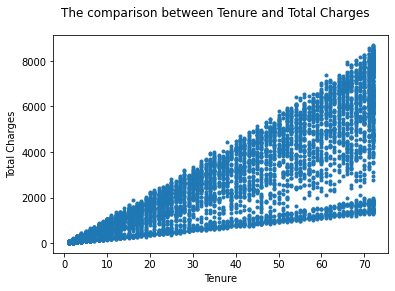

In [0]:
""" We can see that the longer the tenure, the expensive the charges"""
import matplotlib.pyplot as plt
plt.clf()
plt.plot(pd_df["tenure"],pd_df["TotalCharges"],".")
plt.xlabel("Tenure")
plt.ylabel("Total Charges")
plt.suptitle("The comparison between Tenure and Total Charges")
display()

In [0]:
%sql
select * from churn_analysis

customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.3,1840.75,No
9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.7,151.65,Yes
9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes
1452-KIOVK,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.1,1949.4,No
6713-OKOMC,Female,0,No,No,10,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.9,No
7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.8,3046.05,Yes
6388-TABGU,Male,0,No,Yes,62,Yes,No,DSL,Yes,Yes,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No


In [0]:
df.groupBy('churn').count().show()

+-----+-----+
|churn|count|
+-----+-----+
|   No| 5174|
|  Yes| 1869|
+-----+-----+



In [0]:
df.select('tenure','TotalCharges','MonthlyCharges').describe().show()

+-------+------------------+------------------+------------------+
|summary|            tenure|      TotalCharges|    MonthlyCharges|
+-------+------------------+------------------+------------------+
|  count|              7043|              7032|              7043|
|   mean| 32.37114865824223|2283.3004408418697| 64.76169246059922|
| stddev|24.559481023094442| 2266.771361883145|30.090047097678482|
|    min|                 0|              18.8|             18.25|
|    max|                72|            8684.8|            118.75|
+-------+------------------+------------------+------------------+



In [0]:
%sql
select gender , churn ,COUNT(*) FROM churn_analysis GROUP BY gender, churn

gender,churn,count(1)
Male,No,2625
Male,Yes,930
Female,No,2549
Female,Yes,939


Databricks visualization. Run in Databricks to view.

In [0]:
%sql
select SeniorCitizen , churn , count(*) from churn_analysis group by SeniorCitizen , churn

SeniorCitizen,churn,count(1)
1,No,666
0,No,4508
0,Yes,1393
1,Yes,476


Databricks visualization. Run in Databricks to view.

In [0]:
%sql 
select cast(tenure as int) , churn , count(churn)from churn_analysis group by tenure, churn order by cast(tenure as int)

tenure,churn,count(churn)
0,No,11
1,No,233
1,Yes,380
2,No,115
2,Yes,123
3,Yes,94
3,No,106
4,No,93
4,Yes,83
5,No,69


Databricks visualization. Run in Databricks to view.

In [0]:
df.select("SeniorCitizen","InternetService").show()


+-------------+---------------+
|SeniorCitizen|InternetService|
+-------------+---------------+
|            0|            DSL|
|            0|            DSL|
|            0|            DSL|
|            0|            DSL|
|            0|    Fiber optic|
|            0|    Fiber optic|
|            0|    Fiber optic|
|            0|            DSL|
|            0|    Fiber optic|
|            0|            DSL|
|            0|            DSL|
|            0|             No|
|            0|    Fiber optic|
|            0|    Fiber optic|
|            0|    Fiber optic|
|            0|    Fiber optic|
|            0|             No|
|            0|    Fiber optic|
|            0|            DSL|
|            0|    Fiber optic|
+-------------+---------------+
only showing top 20 rows



In [0]:
# Manipulate the seniorcitizen with Internetservice using crosstab
df.crosstab("SeniorCitizen","InternetService").show()

+-----------------------------+----+-----------+----+
|SeniorCitizen_InternetService| DSL|Fiber optic|  No|
+-----------------------------+----+-----------+----+
|                            0|2162|       2265|1474|
|                            1| 259|        831|  52|
+-----------------------------+----+-----------+----+



In [0]:
#Check frequent items in categorical features to show the values that its threshold more than 60%
df.stat.freqItems(["PhoneService", "MultipleLines", "InternetService", "OnlineSecurity", "OnlineBackup", "DeviceProtection", "TechSupport", "StreamingTV", "StreamingMovies"], 0.6).collect()

Out[15]: [Row(PhoneService_freqItems=['Yes'], MultipleLines_freqItems=['Yes'], InternetService_freqItems=['Fiber optic'], OnlineSecurity_freqItems=['No'], OnlineBackup_freqItems=['Yes'], DeviceProtection_freqItems=['No'], TechSupport_freqItems=['No'], StreamingTV_freqItems=['Yes'], StreamingMovies_freqItems=['No'])]

In [0]:
%sql
/* 
   Comparison between PaperlessBilling and churn
*/
SELECT PaperlessBilling, churn, COUNT(*) FROM churn_analysis GROUP BY PaperlessBilling, churn

PaperlessBilling,churn,count(1)
Yes,Yes,1400
No,No,2403
Yes,No,2771
No,Yes,469


Databricks visualization. Run in Databricks to view.

In [0]:
%sql
/* 
   Comparison between PaymentMethod and churn.
   We can see that The payment method by electronic check and mailed check tend to Churn
*/
SELECT PaymentMethod, churn, COUNT(*) FROM churn_analysis GROUP BY PaymentMethod, churn

PaymentMethod,churn,count(1)
Credit card (automatic),No,1290
Bank transfer (automatic),No,1286
Mailed check,Yes,308
Credit card (automatic),Yes,232
Electronic check,No,1294
Electronic check,Yes,1071
Bank transfer (automatic),Yes,258
Mailed check,No,1304


In [0]:
#Split the data into train and test data in the 70:30 split
(train_data,test_data) =df.randomSplit([0.7,0.3],50)
 
print("Number of records for training data : {}".format(train_data.count()) + " rows")
print("Number of records for test data : {}".format(test_data.count()) + " rows")

Number of records for training data : 4885 rows
Number of records for test data : 2158 rows


In [0]:
df.columns


Out[19]: ['customerID',
 'gender',
 'SeniorCitizen',
 'Partner',
 'Dependents',
 'tenure',
 'PhoneService',
 'MultipleLines',
 'InternetService',
 'OnlineSecurity',
 'OnlineBackup',
 'DeviceProtection',
 'TechSupport',
 'StreamingTV',
 'StreamingMovies',
 'Contract',
 'PaperlessBilling',
 'PaymentMethod',
 'MonthlyCharges',
 'TotalCharges',
 'Churn']

In [0]:
#Building the Pipeline
from pyspark.ml import Pipeline
from pyspark.ml.feature import OneHotEncoder, StringIndexer,VectorAssembler
 
catColumns_df = ['gender',
 'SeniorCitizen',
 'Partner',
 'Dependents',
 'PhoneService',
 'MultipleLines',
 'InternetService',
 'OnlineSecurity',
 'OnlineBackup',
 'DeviceProtection',
 'TechSupport',
 'StreamingTV',
 'StreamingMovies',
 'Contract',
 'PaperlessBilling',
 'PaymentMethod']
 

In [0]:
stages = []
for catColumn in catColumns_df:
  stringIndexer =StringIndexer(inputCol =catColumn,outputCol =catColumn + "Index")
  encoder  = OneHotEncoder(inputCols=[stringIndexer.getOutputCol()],outputCols =[catColumn + "catVec"])
  
  stages += [stringIndexer,encoder]
stages

Out[21]: [StringIndexer_8b755db45055,
 OneHotEncoder_d9c472a2b19b,
 StringIndexer_cac237d852dd,
 OneHotEncoder_a6b3619a099d,
 StringIndexer_213b9d3c2458,
 OneHotEncoder_ab60e234e791,
 StringIndexer_85a15eddd36e,
 OneHotEncoder_8a0bd8abf575,
 StringIndexer_9372f3a41064,
 OneHotEncoder_1e0d1670b55f,
 StringIndexer_affd67f43dda,
 OneHotEncoder_3aeb0e554202,
 StringIndexer_b9ac263de513,
 OneHotEncoder_944f998a818e,
 StringIndexer_6355a22f4acc,
 OneHotEncoder_363ac14e7e78,
 StringIndexer_c3429af9c44f,
 OneHotEncoder_a3b1093b088d,
 StringIndexer_52d3e260c384,
 OneHotEncoder_36899e26a1cc,
 StringIndexer_4c87973356a8,
 OneHotEncoder_cc3cd326b46e,
 StringIndexer_b8e24b13193c,
 OneHotEncoder_3ee141862c70,
 StringIndexer_19306ec7fa13,
 OneHotEncoder_ba2a34c0f1ca,
 StringIndexer_56943f9b212c,
 OneHotEncoder_9c32943e6864,
 StringIndexer_49cae782b216,
 OneHotEncoder_0e713b902c53,
 StringIndexer_6ac97a4ff726,
 OneHotEncoder_29c3575b7410]

In [0]:

#imputing null values in totalcharges using Imputer
from pyspark.ml.feature import Imputer 
imputer = Imputer(inputCols =["TotalCharges"],outputCols =["Out_TotalCharges"])
stages += [imputer]

In [0]:
stages

Out[23]: [StringIndexer_8b755db45055,
 OneHotEncoder_d9c472a2b19b,
 StringIndexer_cac237d852dd,
 OneHotEncoder_a6b3619a099d,
 StringIndexer_213b9d3c2458,
 OneHotEncoder_ab60e234e791,
 StringIndexer_85a15eddd36e,
 OneHotEncoder_8a0bd8abf575,
 StringIndexer_9372f3a41064,
 OneHotEncoder_1e0d1670b55f,
 StringIndexer_affd67f43dda,
 OneHotEncoder_3aeb0e554202,
 StringIndexer_b9ac263de513,
 OneHotEncoder_944f998a818e,
 StringIndexer_6355a22f4acc,
 OneHotEncoder_363ac14e7e78,
 StringIndexer_c3429af9c44f,
 OneHotEncoder_a3b1093b088d,
 StringIndexer_52d3e260c384,
 OneHotEncoder_36899e26a1cc,
 StringIndexer_4c87973356a8,
 OneHotEncoder_cc3cd326b46e,
 StringIndexer_b8e24b13193c,
 OneHotEncoder_3ee141862c70,
 StringIndexer_19306ec7fa13,
 OneHotEncoder_ba2a34c0f1ca,
 StringIndexer_56943f9b212c,
 OneHotEncoder_9c32943e6864,
 StringIndexer_49cae782b216,
 OneHotEncoder_0e713b902c53,
 StringIndexer_6ac97a4ff726,
 OneHotEncoder_29c3575b7410,
 Imputer_3e78081f9cb2]

In [0]:
label_Idx = StringIndexer(inputCol="Churn",outputCol="label")
stages +=[label_Idx]

In [0]:
temp = label_Idx.fit(train_data).transform(train_data)


In [0]:
temp.toPandas().head()


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,label
0,0002-ORFBO,Female,0,Yes,Yes,9,Yes,No,DSL,No,...,Yes,Yes,No,One year,Yes,Mailed check,65.6,593.30,No,0.0
1,0003-MKNFE,Male,0,No,No,9,Yes,Yes,DSL,No,...,No,No,Yes,Month-to-month,No,Mailed check,59.9,542.40,No,0.0
2,0004-TLHLJ,Male,0,No,No,4,Yes,No,Fiber optic,No,...,No,No,No,Month-to-month,Yes,Electronic check,73.9,280.85,Yes,1.0
3,0011-IGKFF,Male,1,Yes,No,13,Yes,No,Fiber optic,No,...,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.0,1237.85,Yes,1.0
4,0013-EXCHZ,Female,1,Yes,No,3,Yes,No,Fiber optic,No,...,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.9,267.40,Yes,1.0


In [0]:
#Check the correlation between TotalCharges and MonthlyCharges
df.stat.corr("TotalCharges","MonthlyCharges")

Out[27]: 0.6511738315787813

In [0]:
%sql
/* 
   Comparison between tenure<Yes> and churn
*/
SELECT CAST(tenure AS int), churn, COUNT(*) AS churned FROM churn_analysis WHERE churn='Yes' GROUP BY tenure, churn ORDER BY CAST(tenure AS int)

tenure,churn,churned
1,Yes,380
2,Yes,123
3,Yes,94
4,Yes,83
5,Yes,64
6,Yes,40
7,Yes,51
8,Yes,42
9,Yes,46
10,Yes,45


In [0]:
"""Make the buckets for the tenure"""
from pyspark.ml.feature import QuantileDiscretizer
tenure_bin =QuantileDiscretizer(numBuckets=3,inputCol="tenure",outputCol="tenure_bin")
stages +=[tenure_bin]

In [0]:
"""join features into vector form"""
numericCols =["tenure_bin","Out_TotalCharges","MonthlyCharges"]
assembleInputs =assemblerInputs =[column + "catVec" for column in catColumns_df] +numericCols
assembler = VectorAssembler(inputCols=assembleInputs,outputCol="features")
stages +=[assembler]

In [0]:
#Standarization
pipeline =Pipeline().setStages(stages)
pipelineModel =pipeline.fit(train_data)

In [0]:
trainDF =pipelineModel.transform(train_data)
testDF =pipelineModel.transform(test_data)

In [0]:
trainDF.select("tenure_bin").show()


+----------+
|tenure_bin|
+----------+
|       0.0|
|       0.0|
|       0.0|
|       0.0|
|       0.0|
|       0.0|
|       2.0|
|       2.0|
|       0.0|
|       2.0|
|       2.0|
|       0.0|
|       2.0|
|       2.0|
|       1.0|
|       1.0|
|       0.0|
|       2.0|
|       0.0|
|       1.0|
+----------+
only showing top 20 rows



In [0]:
#Implement Machine learning algorithm for classification
from pyspark.ml.classification import LogisticRegression
 
#create instance of LogisticRegression
lr =LogisticRegression(labelCol="label",featuresCol="features",maxIter=10)
 
#Train model with training data
lrModel =lr.fit(trainDF)

In [0]:
#Check the coefficient and ntercept for the logsticregression model
print("Coefficients: {}".format(lrModel.coefficients))
print("Intercept: {}".format(lrModel.intercept))
 

Coefficients: [-0.006283663129988122,-0.2605445629706064,0.05170418652750266,0.11954498288344698,-0.2435220644140108,-0.16353618831107714,0.08098622232535203,0.4825551370827489,-0.2546873132034549,0.333031698365781,-0.10653115297331689,0.1954420041848279,0.058936072580919006,0.10408905468636022,0.15894622935607614,0.2722544591662103,-0.0318178883062628,-0.019336624185412078,0.278350346161927,0.19585619181968206,0.061983745302202256,0.7909428604918338,-0.765724750931067,0.29243316165301736,0.4392353622777015,0.15641016133336053,0.07397043080655803,-0.7403750914938034,-5.259397724555747e-05,0.005348611331131066]
Intercept: -2.120850794746336


In [0]:
summary = lrModel.summary


In [0]:
#Measure the performance of ML algorithm
accuracy = summary.accuracy
falsePositiveRate = summary.weightedFalsePositiveRate
truePositiveRate = summary.weightedTruePositiveRate
fMeasure = summary.weightedFMeasure()
precision = summary.weightedPrecision
recall = summary.weightedRecall
auroc =summary.areaUnderROC
print("Accuracy: {}n\nFPR: {}\nTPR:{}\nF-measure: {}\nPrecision: {}\nRecall: {}\nAreaUnderROC: {}".format(accuracy, falsePositiveRate, truePositiveRate, fMeasure, precision, recall,auroc))

Accuracy: 0.7991811668372569n
FPR: 0.3741948952748083
TPR:0.7991811668372568
F-measure: 0.7919749055824199
Precision: 0.7896413809882163
Recall: 0.7991811668372568
AreaUnderROC: 0.8423438682722582


In [0]:
display(lrModel,trainDF,"ROC")


False Positive Rate,True Positive Rate,Threshold
0.0,0.0,0.816267144923285
0.0,0.03571428571428571,0.816267144923285
0.0,0.07142857142857142,0.7540855507942656
0.0,0.10714285714285714,0.7257622084796447
0.0,0.14285714285714285,0.6981123087232638
0.012345679012345678,0.14285714285714285,0.6678586710939016
0.024691358024691357,0.14285714285714285,0.6434791653553589
0.037037037037037035,0.14285714285714285,0.6329391422118856
0.037037037037037035,0.17857142857142858,0.6318918836534306
0.04938271604938271,0.17857142857142858,0.6212234678918775


In [0]:
#Examine the model using test data
from pyspark.ml.evaluation import BinaryClassificationEvaluator
predictions = lrModel.transform(testDF)
evaluatorLR = BinaryClassificationEvaluator(rawPredictionCol="prediction")
area_under_curve = evaluatorLR.evaluate(predictions)
 
#default evaluation is areaUnderROC
print("areaUnderROC = {}".format(area_under_curve))
evaluatorLR.getMetricName()

areaUnderROC = 0.7082814088117019
Out[39]: 'areaUnderROC'

In [0]:
from pyspark.mllib.evaluation import BinaryClassificationMetrics
 
results = predictions.select(['prediction', 'label'])
 
## prepare score-label set
results_collect = results.collect()
results_list = [(float(pred_label[0]), float(pred_label[1])) for pred_label in results_collect]
predictionAndLabels = sc.parallelize(results_list)
 
metrics = BinaryClassificationMetrics(predictionAndLabels)
 
# Area under precision-recall curve
print("Area under PR ={}".format( metrics.areaUnderPR))
 
# Area under ROC curve
print("Area under ROC ={}".format(metrics.areaUnderROC))
 
predictions.toPandas().head()

/databricks/spark/python/pyspark/sql/context.py:165: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


Area under PR =0.5616929841406697
Area under ROC =0.7082814088117019


/databricks/spark/python/pyspark/sql/pandas/conversion.py:122: UserWarning: toPandas attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Unable to convert the field gendercatVec. If this column is not necessary, you may consider dropping it or converting to primitive type before the conversion.
Direct cause: Unsupported type in conversion to Arrow: VectorUDT()
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,PaperlessBillingcatVec,PaymentMethodIndex,PaymentMethodcatVec,Out_TotalCharges,label,tenure_bin,features,rawPrediction,probability,prediction
0,0016-QLJIS,Female,0,Yes,Yes,65,Yes,Yes,DSL,Yes,...,(1.0),1.0,"(0.0, 1.0, 0.0)",5957.9,0.0,2.0,"(0.0, 1.0, 0.0, 0.0, 1.0, 0.0, 1.0, 0.0, 1.0, ...","[3.8720780874328296, -3.8720780874328296]","[0.9796093635856696, 0.020390636414330365]",0.0
1,0019-GFNTW,Female,0,No,No,56,No,No phone service,DSL,Yes,...,(0.0),3.0,"(0.0, 0.0, 0.0)",2560.1,0.0,2.0,"(0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, ...","[4.482818954332814, -4.482818954332814]","[0.9888247870100044, 0.011175212989995575]",0.0
2,0021-IKXGC,Female,1,No,No,1,Yes,Yes,Fiber optic,No,...,(1.0),0.0,"(1.0, 0.0, 0.0)",72.1,0.0,0.0,"(0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 0.0, ...","[-1.2223362428163713, 1.2223362428163713]","[0.227525576574144, 0.772474423425856]",1.0
3,0030-FNXPP,Female,0,No,No,3,Yes,No,No,No internet service,...,(0.0),1.0,"(0.0, 1.0, 0.0)",57.2,0.0,0.0,"(0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, ...","[1.5666898597813808, -1.5666898597813808]","[0.827311209481561, 0.172688790518439]",0.0
4,0042-RLHYP,Female,0,Yes,Yes,69,Yes,No,No,No internet service,...,(0.0),3.0,"(0.0, 0.0, 0.0)",1396.9,0.0,2.0,"(0.0, 1.0, 0.0, 0.0, 1.0, 1.0, 0.0, 0.0, 0.0, ...","[5.003029427951741, -5.003029427951741]","[0.993327258816269, 0.006672741183730957]",0.0


In [0]:
test_data.groupBy('Churn').count().show()


+-----+-----+
|Churn|count|
+-----+-----+
|   No| 1588|
|  Yes|  570|
+-----+-----+



In [0]:
#Confussion Matrix implementation
count=predictions.count()
correct = results.filter(results.prediction == results.label).count()
wrong = results.filter(results.prediction != results.label).count()
tp = results.filter(results.prediction == 1.0).filter(results.prediction == results.label).count()
fp = results.filter(results.prediction == 1.0).filter(results.prediction != results.label).count()
fn = results.filter(results.prediction == 0.0).filter(results.prediction != results.label).count()
tn = results.filter(results.prediction == 0.0).filter(results.prediction == results.label).count()
 
accuracy = (tp+tn)/count
precision = tp/(tp+fp)
recall = tp/(tp+fn)
 
print("Correct:{}\nWrong:{}\ntp:{}\nfp:{}\nfn:{}\ntn:{}\nAccuracy: {}\nPrecision: {}\nRecall: {}".format(correct, wrong, tp, fp, fn, tn, accuracy, precision, recall))

Correct:1728
Wrong:430
tp:292
fp:152
fn:278
tn:1436
Accuracy: 0.8007414272474513
Precision: 0.6576576576576577
Recall: 0.512280701754386


In [0]:
# we use cross validation and HyperParameter to improve the result 
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
 
# Create ParamGrid for Cross Validation
paramGrid = (ParamGridBuilder()
             .addGrid(lr.regParam, [0.01, 0.5, 2.0])
             .addGrid(lr.elasticNetParam, [0.0, 0.5, 1.0])
             .addGrid(lr.maxIter, [5, 10, 20])
             .build())


In [0]:
#implement cross validation
cv = CrossValidator(estimator=lr, estimatorParamMaps=paramGrid, evaluator=evaluatorLR, numFolds=5)
# Run cross validations
cvModel = cv.fit(trainDF)



In [0]:
predictions = cvModel.bestModel.transform(testDF)
evaluatorLR.evaluate(predictions)

Out[45]: 0.7045704626806311

In [0]:
#Confussion Matrix implementation
results = predictions.select(['prediction', 'label'])
count=predictions.count()
correct = results.filter(results.prediction == results.label).count()
wrong = results.filter(results.prediction != results.label).count()
tp = results.filter(results.prediction == 1.0).filter(results.prediction == results.label).count()
fp = results.filter(results.prediction == 1.0).filter(results.prediction != results.label).count()
fn = results.filter(results.prediction == 0.0).filter(results.prediction != results.label).count()
tn = results.filter(results.prediction == 0.0).filter(results.prediction == results.label).count()
 
accuracy = (tp+tn)/count
precision = tp/(tp+fp)
recall = tp/(tp+fn)
 
print("Correct:{}\nWrong:{}\ntp:{}\nfp:{}\nfn:{}\ntn:{}\nAccuracy: {}\nPrecision: {}\nRecall: {}".format(correct, wrong, tp, fp, fn, tn, accuracy, precision, recall))

Correct:1718
Wrong:440
tp:291
fp:161
fn:279
tn:1427
Accuracy: 0.7961075069508804
Precision: 0.6438053097345132
Recall: 0.5105263157894737


In [0]:
#Check each params for each iteration
cvModel.explainParams()

Out[47]: "estimator: estimator to be cross-validated (current: LogisticRegression_b1ea36ec4197)\nestimatorParamMaps: estimator param maps (current: [{Param(parent='LogisticRegression_b1ea36ec4197', name='regParam', doc='regularization parameter (>= 0).'): 0.01, Param(parent='LogisticRegression_b1ea36ec4197', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0, Param(parent='LogisticRegression_b1ea36ec4197', name='maxIter', doc='max number of iterations (>= 0).'): 5}, {Param(parent='LogisticRegression_b1ea36ec4197', name='regParam', doc='regularization parameter (>= 0).'): 0.01, Param(parent='LogisticRegression_b1ea36ec4197', name='elasticNetParam', doc='the ElasticNet mixing parameter, in range [0, 1]. For alpha = 0, the penalty is an L2 penalty. For alpha = 1, it is an L1 penalty.'): 0.0, Param(parent='LogisticRegression_b1ea36ec4197', name='maxIter', doc='max number of i

In [0]:
#Implement another Classification ML algorithms
from pyspark.ml.classification import RandomForestClassifier
 
rf = RandomForestClassifier(labelCol="label", featuresCol="features").setImpurity("gini").setMaxDepth(6).setNumTrees(50).setFeatureSubsetStrategy("auto").setSeed(4500)
 
rfModel = rf.fit(trainDF)

In [0]:
predictions = rfModel.transform(testDF)


In [0]:
#Confussion Matrix implementation
results = predictions.select(['prediction', 'label'])
count=predictions.count()
correct = results.filter(results.prediction == results.label).count()
wrong = results.filter(results.prediction != results.label).count()
tp = results.filter(results.prediction == 1.0).filter(results.prediction == results.label).count()
fp = results.filter(results.prediction == 1.0).filter(results.prediction != results.label).count()
fn = results.filter(results.prediction == 0.0).filter(results.prediction != results.label).count()
tn = results.filter(results.prediction == 0.0).filter(results.prediction == results.label).count()
 
accuracy = (tp+tn)/count
precision = tp/(tp+fp)
recall = tp/(tp+fn)
 
print("Correct:{}\nWrong:{}\ntp:{}\nfp:{}\nfn:{}\ntn:{}\nAccuracy: {}\nPrecision: {}\nRecall: {}".format(correct, wrong, tp, fp, fn, tn, accuracy, precision, recall))

Correct:1718
Wrong:440
tp:240
fp:110
fn:330
tn:1478
Accuracy: 0.7961075069508804
Precision: 0.6857142857142857
Recall: 0.42105263157894735


In [0]:
from pyspark.ml.classification import GBTClassifier
gbt = GBTClassifier(labelCol="label", featuresCol="features", maxIter=20)

In [0]:
gbtModel =gbt.fit(trainDF)


In [0]:
predictions = gbtModel.transform(testDF)


In [0]:
#Confussion Matrix implementation
results = predictions.select(['prediction', 'label'])
count=predictions.count()
correct = results.filter(results.prediction == results.label).count()
wrong = results.filter(results.prediction != results.label).count()
tp = results.filter(results.prediction == 1.0).filter(results.prediction == results.label).count()
fp = results.filter(results.prediction == 1.0).filter(results.prediction != results.label).count()
fn = results.filter(results.prediction == 0.0).filter(results.prediction != results.label).count()
tn = results.filter(results.prediction == 0.0).filter(results.prediction == results.label).count()
 
accuracy = (tp+tn)/count
precision = tp/(tp+fp)
recall = tp/(tp+fn) 

In [0]:
from pyspark.ml.classification import NaiveBayes
nb = NaiveBayes(smoothing=1.0, modelType="multinomial")
nbModel =nb.fit(trainDF)

In [0]:
predictions = nbModel.transform(testDF)


In [0]:
#Confussion Matrix implementation
results = predictions.select(['prediction', 'label'])
count=predictions.count()
correct = results.filter(results.prediction == results.label).count()
wrong = results.filter(results.prediction != results.label).count()
tp = results.filter(results.prediction == 1.0).filter(results.prediction == results.label).count()
fp = results.filter(results.prediction == 1.0).filter(results.prediction != results.label).count()
fn = results.filter(results.prediction == 0.0).filter(results.prediction != results.label).count()
tn = results.filter(results.prediction == 0.0).filter(results.prediction == results.label).count()
 
accuracy = (tp+tn)/count
precision = tp/(tp+fp)
recall = tp/(tp+fn) 
print("Correct:{}\nWrong:{}\ntp:{}\nfp:{}\nfn:{}\ntn:{}\nAccuracy: {}\nPrecision: {}\nRecall: {}".format(correct, wrong, tp, fp, fn, tn, accuracy, precision, recall))

Correct:1379
Wrong:779
tp:434
fp:643
fn:136
tn:945
Accuracy: 0.639017608897127
Precision: 0.40297121634168986
Recall: 0.7614035087719299
